<a href="https://colab.research.google.com/github/joyaldesai/ML-PROJECT/blob/main/Joyal_ML(Clustering)_Submission_Template.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>



# **Project Name**    - ONLINE RETAIL CLUSTERING

##### **Project Type**    - EDA/Clustering
##### **Contribution**    - Individual
##### **Team Member  -**  Joyal Desai

# **Project Summary -**



This project focuses on performing customer segmentation for an online retail dataset using clustering techniques. The objective is to identify distinct customer groups based on their purchasing behavior.

The initial steps involved loading and inspecting the dataset, including checking for duplicate and missing values. Data cleaning and wrangling were performed, addressing missing values and handling outliers in 'Quantity' and 'UnitPrice'. New features like 'InvoiceMonth', 'InvoiceYear', and 'Revenue' were created to enhance the analysis.

Exploratory Data Analysis (EDA) was conducted through various visualizations. Charts were generated to understand customer distribution across countries, revenue generated by different countries, and the temporal trends of revenue and invoices. Word clouds were also created to visualize popular product descriptions and countries.

Feature engineering involved combining relevant categorical and text columns to create a new feature for text analysis. Text cleaning techniques such as lowercasing, removing special characters, and stemming were applied. TF-IDF vectorization was used to convert the cleaned text data into numerical representations. Principal Component Analysis (PCA) was then applied to reduce the dimensionality of the TF-IDF features.

Clustering models, specifically K-Means and Agglomerative Clustering, were implemented on the processed data. The Elbow method and Silhouette analysis were used to determine the optimal number of clusters. Both methods suggested a similar number of clusters. The K-Means model was fitted, and clusters were assigned to the dataset. Word clouds were generated for each cluster to gain insights into the characteristics and preferences of each customer segment based on product descriptions and countries.

Finally, the Silhouette score was calculated to evaluate the performance of the K-Means clustering model, providing a quantitative measure of how well-separated the clusters are.

# **GitHub Link -**

Provide your GitHub Link here.

# **Problem Statement**


The objective of this project is to perform customer segmentation on the online retail dataset to identify distinct customer groups based on their purchasing behavior. By understanding these segments, businesses can tailor marketing strategies, improve customer service, and optimize product offerings to better meet the needs of different customer profiles. This segmentation will provide actionable insights for targeted campaigns and business growth.

# **General Guidelines** : -  

1.   Well-structured, formatted, and commented code is required.
2.   Exception Handling, Production Grade Code & Deployment Ready Code will be a plus. Those students will be awarded some additional credits.
     
     The additional credits will have advantages over other students during Star Student selection.
       
             [ Note: - Deployment Ready Code is defined as, the whole .ipynb notebook should be executable in one go
                       without a single error logged. ]

3.   Each and every logic should have proper comments.
4. You may add as many number of charts you want. Make Sure for each and every chart the following format should be answered.
        

```
# Chart visualization code
```
            

*   Why did you pick the specific chart?
*   What is/are the insight(s) found from the chart?
* Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

5. You have to create at least 15 logical & meaningful charts having important insights.


[ Hints : - Do the Vizualization in  a structured way while following "UBM" Rule.

U - Univariate Analysis,

B - Bivariate Analysis (Numerical - Categorical, Numerical - Numerical, Categorical - Categorical)

M - Multivariate Analysis
 ]





6. You may add more ml algorithms for model creation. Make sure for each and every algorithm, the following format should be answered.


*   Explain the ML Model used and it's performance using Evaluation metric Score Chart.


*   Cross- Validation & Hyperparameter Tuning

*   Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

*   Explain each evaluation metric's indication towards business and the business impact pf the ML model used.




















# ***Let's Begin !***

## ***1. Know Your Data***

### Import Libraries

In [ ]:
# import the dependancy
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from wordcloud import WordCloud, STOPWORDS
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split, KFold
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_samples
import matplotlib.cm as cm
import scipy.cluster.hierarchy as sch
from os import path
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from sklearn.metrics import silhouette_score
from sklearn.cluster import AgglomerativeClustering
import warnings
warnings.filterwarnings('ignore')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


### Dataset Loading

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Load Dataset
df = pd.read_excel('/content/drive/MyDrive/ML project /ML PROJECT(CLUSTERING)/xls of Online Retail.xlsx')

### Dataset First View

In [ ]:
# Dataset First Look
df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom


### Dataset Rows & Columns count

In [ ]:
# Dataset Rows & Columns count
df.shape

(541909, 8)

### Dataset Information

In [ ]:
# Dataset Info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541909 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   InvoiceNo    541909 non-null  object        
 1   StockCode    541909 non-null  object        
 2   Description  540455 non-null  object        
 3   Quantity     541909 non-null  int64         
 4   InvoiceDate  541909 non-null  datetime64[ns]
 5   UnitPrice    541909 non-null  float64       
 6   CustomerID   406829 non-null  float64       
 7   Country      541909 non-null  object        
dtypes: datetime64[ns](1), float64(2), int64(1), object(4)
memory usage: 33.1+ MB


#### Duplicate Values

In [ ]:
# Dataset Duplicate Value Count
df.duplicated().sum()

np.int64(5268)

#### Missing Values/Null Values

In [ ]:
# Missing Values/Null Values Count
for col in df.columns:
  null_rate = df[col].isnull().sum() / len(df) * 100
  if null_rate > 0:
    print(f'The null values in {col} column are  {df[col].isnull().sum()} Percentage:- {null_rate}%')

The null values in Description column are  1454 Percentage:- 0.2683107311375157%
The null values in CustomerID column are  135080 Percentage:- 24.926694334288598%


<Axes: >

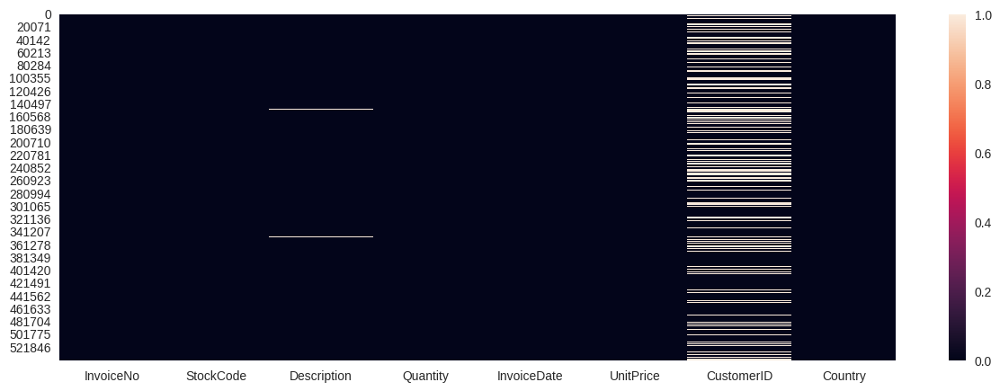

In [ ]:
# Visualizing the missing values
plt.figure(figsize=(15,5))
sns.heatmap(df.isna())

### What did you know about your dataset?

* The dataset contains information about online retail transactions.
* It has multiple columns, including 'InvoiceNo', 'StockCode', 'Description', 'Quantity', 'InvoiceDate', 'UnitPrice', and 'CustomerID'.
* There are a significant number of duplicate rows in the dataset.
* There are missing values in the 'Description' and 'CustomerID' columns. The 'Description' column has a substantial percentage of missing values.

These initial observations indicate that data cleaning and handling of missing and duplicate values will be necessary before further analysis.

## ***2. Understanding Your Variables***

In [ ]:
# Dataset Columns
df.columns

Index(['InvoiceNo', 'StockCode', 'Description', 'Quantity', 'InvoiceDate',
       'UnitPrice', 'CustomerID', 'Country'],
      dtype='object')

In [ ]:
# Dataset Describe
df.describe(include='all')

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
count,541909.0,541909,540455,541909.000000,541909,541909.000000,406829.000000,541909
unique,25900.0,4070,4223,NaN,NaN,NaN,NaN,38
top,573585.0,85123A,WHITE HANGING HEART T-LIGHT HOLDER,NaN,NaN,NaN,NaN,United Kingdom
freq,1114.0,2313,2369,NaN,NaN,NaN,NaN,495478
mean,NaN,NaN,NaN,9.552250,2011-07-04 13:34:57.156386048,4.611114,15287.690570,NaN
min,NaN,NaN,NaN,-80995.000000,2010-12-01 08:26:00,-11062.060000,12346.000000,NaN
25%,NaN,NaN,NaN,1.000000,2011-03-28 11:34:00,1.250000,13953.000000,NaN
50%,NaN,NaN,NaN,3.000000,2011-07-19 17:17:00,2.080000,15152.000000,NaN
75%,NaN,NaN,NaN,10.000000,2011-10-19 11:27:00,4.130000,16791.000000,NaN
max,NaN,NaN,NaN,80995.000000,2011-12-09 12:50:00,38970.000000,18287.000000,NaN


### Variables Description

Answer here

### Check Unique Values for each variable.

In [ ]:
# Check Unique Values for each variable.
df.nunique()

,0
InvoiceNo,25900
StockCode,4070
Description,4223
Quantity,722
InvoiceDate,23260
UnitPrice,1630
CustomerID,4372
Country,38


### Variables Description

[1] InvoiceNo:A unique code assigned to each order or transaction.

[2] StockCode: An identifier for each unique product in the catalog.

[3] Description: A detailed description of the product.

[4] Quantity: The number of units of a product purchased in a single transaction. Can be positive (purchase) or negative (return).

[5] InvoiceDate: The date and time when the transaction took place.

[6] UnitPrice: The price of one unit of the product.

[7] CustomerID: A unique identifier for each customer.
Data Type: Integer .

[8] Country: The country where the transaction occurred.


## 3. ***Data Wrangling***

### Data Wrangling Code

In [ ]:
# Write your code to make your dataset analysis ready.
df.dropna(subset=['Description'],inplace=True)
df['CustomerID'] = df['CustomerID'].fillna(df['CustomerID'].mode()[0])
df['CustomerID'] = df['CustomerID'].astype('int')

df.drop_duplicates(inplace=True)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 535187 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   InvoiceNo    535187 non-null  object        
 1   StockCode    535187 non-null  object        
 2   Description  535187 non-null  object        
 3   Quantity     535187 non-null  int64         
 4   InvoiceDate  535187 non-null  datetime64[ns]
 5   UnitPrice    535187 non-null  float64       
 6   CustomerID   535187 non-null  int64         
 7   Country      535187 non-null  object        
dtypes: datetime64[ns](1), float64(1), int64(2), object(4)
memory usage: 36.7+ MB


In [ ]:
# let's create a function to check the outliers
columns = ['Quantity','UnitPrice']

def check_outliers(columns,df):

  # use plotly for better plot
  for i in columns:
    fig = px.box(df,y=i)
    fig.update_layout(height=500, width=500)
    fig.show()

check_outliers(columns,df)

In [ ]:
# let's create a function to check the outliers

def treat_outliers(columns,df):
   for column in columns:
     Q1 = df[column].quantile(0.25)
     Q3 = df[column].quantile(0.75)
     IQR = Q3-Q1
     lower_limit = Q1-1.5*IQR
     upper_limit = Q3+1.5*IQR
     df[column] = df[column].clip(lower=lower_limit, upper=upper_limit)
   return df

df=treat_outliers(columns,df)

In [ ]:
df['InvoiceDate'] = pd.to_datetime(df['InvoiceDate'])
df['InvoiceTime'] = df['InvoiceDate'].dt.time
df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,InvoiceTime
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6.0,2010-12-01 08:26:00,2.55,17850,United Kingdom,08:26:00
1,536365,71053,WHITE METAL LANTERN,6.0,2010-12-01 08:26:00,3.39,17850,United Kingdom,08:26:00
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8.0,2010-12-01 08:26:00,2.75,17850,United Kingdom,08:26:00
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6.0,2010-12-01 08:26:00,3.39,17850,United Kingdom,08:26:00
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6.0,2010-12-01 08:26:00,3.39,17850,United Kingdom,08:26:00


In [ ]:
df['InvoiceMonth'] = df['InvoiceDate'].dt.month
df['InvoiceYear'] = df['InvoiceDate'].dt.year
df['InvoiceDate'] = df['InvoiceDate'].dt.date
df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,InvoiceTime,InvoiceMonth,InvoiceYear
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6.0,2010-12-01,2.55,17850,United Kingdom,08:26:00,12,2010
1,536365,71053,WHITE METAL LANTERN,6.0,2010-12-01,3.39,17850,United Kingdom,08:26:00,12,2010
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8.0,2010-12-01,2.75,17850,United Kingdom,08:26:00,12,2010
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6.0,2010-12-01,3.39,17850,United Kingdom,08:26:00,12,2010
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6.0,2010-12-01,3.39,17850,United Kingdom,08:26:00,12,2010


In [ ]:
(df['Quantity']>0).value_counts()

,count
Quantity,
True,525462
False,9725


In [ ]:
returns_df = df[df['Quantity']<0]
returns_df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,InvoiceTime,InvoiceMonth,InvoiceYear
141,C536379,D,Discount,-1.0,2010-12-01,8.45,14527,United Kingdom,09:41:00,12,2010
154,C536383,35004C,SET OF 3 COLOURED FLYING DUCKS,-1.0,2010-12-01,4.65,15311,United Kingdom,09:49:00,12,2010
235,C536391,22556,PLASTERS IN TIN CIRCUS PARADE,-12.0,2010-12-01,1.65,17548,United Kingdom,10:24:00,12,2010
236,C536391,21984,PACK OF 12 PINK PAISLEY TISSUES,-12.5,2010-12-01,0.29,17548,United Kingdom,10:24:00,12,2010
237,C536391,21983,PACK OF 12 BLUE PAISLEY TISSUES,-12.5,2010-12-01,0.29,17548,United Kingdom,10:24:00,12,2010


In [ ]:
df['Quantity'] = df['Quantity'].abs()
df.shape

(535187, 11)

In [ ]:
df['Revenue'] = df['Quantity'] * df['UnitPrice']
df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,InvoiceTime,InvoiceMonth,InvoiceYear,Revenue
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6.0,2010-12-01,2.55,17850,United Kingdom,08:26:00,12,2010,15.30
1,536365,71053,WHITE METAL LANTERN,6.0,2010-12-01,3.39,17850,United Kingdom,08:26:00,12,2010,20.34
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8.0,2010-12-01,2.75,17850,United Kingdom,08:26:00,12,2010,22.00
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6.0,2010-12-01,3.39,17850,United Kingdom,08:26:00,12,2010,20.34
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6.0,2010-12-01,3.39,17850,United Kingdom,08:26:00,12,2010,20.34


In [ ]:
returns_df['Revenue'] = returns_df['Quantity'] * returns_df['UnitPrice']
returns_df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,InvoiceTime,InvoiceMonth,InvoiceYear,Revenue
141,C536379,D,Discount,-1.0,2010-12-01,8.45,14527,United Kingdom,09:41:00,12,2010,-8.450
154,C536383,35004C,SET OF 3 COLOURED FLYING DUCKS,-1.0,2010-12-01,4.65,15311,United Kingdom,09:49:00,12,2010,-4.650
235,C536391,22556,PLASTERS IN TIN CIRCUS PARADE,-12.0,2010-12-01,1.65,17548,United Kingdom,10:24:00,12,2010,-19.800
236,C536391,21984,PACK OF 12 PINK PAISLEY TISSUES,-12.5,2010-12-01,0.29,17548,United Kingdom,10:24:00,12,2010,-3.625
237,C536391,21983,PACK OF 12 BLUE PAISLEY TISSUES,-12.5,2010-12-01,0.29,17548,United Kingdom,10:24:00,12,2010,-3.625


In [ ]:
returns_df.shape

(9725, 12)

### What all manipulations have you done and insights you found?

The following manipulations were performed to prepare the dataset for analysis and clustering:

**1.Handling Missing Values:**

  * Manipulation: Rows with missing values in the 'Description' column were removed using df.dropna(subset=['Description'], inplace=True). Missing values in the 'CustomerID' column were filled with the most frequent value (mode) using df['CustomerID'].fillna(df['CustomerID'].mode()[0]).
  * Insights: This step is crucial for ensuring the dataset is complete and suitable for analysis. Missing descriptions would hinder product analysis, and missing Customer IDs prevent customer-level insights. Filling Customer IDs with the mode allows these transactions to be included in the analysis, although it's important to be mindful of the potential impact on customer-specific insights for these imputed values.

**2.Handling Duplicate Values:**

* Manipulation: Duplicate rows were removed using df.drop_duplicates(inplace=True).
* Insights: Duplicate rows can skew analysis and lead to incorrect results. Removing them ensures each transaction record is unique.
Converting Data Types:

* Manipulation: The 'CustomerID' column was converted to an integer type using df['CustomerID'].astype('int'). The 'InvoiceDate' column was converted to datetime objects using pd.to_datetime(df['InvoiceDate']).
* Insights: Converting 'CustomerID' to integer is appropriate for identification. Converting 'InvoiceDate' to datetime is essential for extracting temporal features and performing time-based analysis.

**4.Handling Outliers:**

* Manipulation: A function treat_outliers was created to identify and cap outliers in the 'Quantity' and 'UnitPrice' columns using the Interquartile Range (IQR) method. The values outside the calculated lower and upper limits were clipped to these limits.
* Insights: Outliers in 'Quantity' and 'UnitPrice' can heavily distort calculations like revenue and impact clustering results. Clipping these extreme values helps to make the data more robust and representative for analysis.

**5.Handling Negative Quantities (Returns):**

* Manipulation: Transactions with negative quantities were identified and stored in a separate DataFrame returns_df. The 'Quantity' column in the main DataFrame df was then converted to its absolute value using df['Quantity'].abs().
* Insights: Negative quantities represent product returns. Separating them allows for specific analysis of return behavior if needed. Converting the quantity to absolute values in the main DataFrame is necessary for accurate revenue calculations and clustering based on purchase volume, regardless of whether it was an initial purchase or a return.

**6.Creating New Features:**

* Manipulation: 'InvoiceTime', 'InvoiceMonth', and 'InvoiceYear' were extracted from 'InvoiceDate'. A 'Revenue' column was calculated as Quantity * UnitPrice.
* Insights: These new features add significant value to the analysis:
   * InvoiceTime allows for analyzing purchasing patterns throughout the day.
   * InvoiceMonth and InvoiceYear enable the analysis of seasonal and yearly trends in sales.
   * Revenue is a direct measure of the monetary value of each transaction, which is crucial for understanding sales performance and potentially for RFM (Recency, Frequency, Monetary) analysis in customer segmentation.

## ***4. Data Vizualization, Storytelling & Experimenting with charts : Understand the relationships between variables***

#### Chart - 1 :  **Analysis 'Country' column**

In [ ]:
country_customers = df.groupby('Country')['CustomerID'].nunique().sort_values(ascending=False).head(10)
country_customers

,CustomerID
Country,
United Kingdom,3950
Germany,95
France,88
Spain,31
Belgium,25
Switzerland,22
Portugal,20
Italy,15
Finland,12


In [ ]:
# Chart - 1 visualization code
fig = px.bar(x=country_customers.index,y=country_customers.values,labels={'x':'Country','y':'Number of Customers'},
             color=country_customers.values,text=country_customers.values)
fig.update_layout(
    title='Top 10 Countries with Highest Number of Customers',
    xaxis_tickangle=-90,
    width=1400,
    height=500
)
fig.show()

Type Country
* United Kingdom has highest number of customers.

#### Chart - 2 : **Analysis Countrywise Revenue**

In [ ]:
revenue_country = df.groupby('Country')['Revenue'].sum().sort_values(ascending=False).head(10)
revenue_country

,Revenue
Country,
United Kingdom,6158980.079
Germany,189611.440
EIRE,180796.970
France,162262.715
Netherlands,84269.875
Australia,45052.485
Switzerland,44490.110
Spain,43210.420
Belgium,36139.300


In [ ]:
# Chart - 2 visualization code

fig = px.bar(x=revenue_country.index, y=revenue_country.values,
             labels={'x':'Country','y':'Revenue'},color=revenue_country.index , text=revenue_country.values)

fig.update_layout(
    title='Top 10 Countries with Highest Revenue',
    xaxis_tickangle=-90,
    width=1400,
    height=500
)

fig.show()

* Highest Number Of Income Created By United Kingdom and Germany .

#### Chart - 3 : **Analysis Monthwise Revenue**

In [ ]:
monthwise_revenue = df.groupby('InvoiceMonth')['Revenue'].sum()
monthwise_revenue

,Revenue
InvoiceMonth,
1,433222.050
2,371822.120
3,493080.650
4,383600.591
5,537415.220
6,486977.000
7,490411.581
8,500596.470
9,725397.472


In [ ]:
# Chart - 3 visualization code
fig = px.bar(x=monthwise_revenue.index, y=monthwise_revenue.values,
             labels={'x':'Month','y':'Revenue'},color=monthwise_revenue.index , text=monthwise_revenue.values)
fig.update_layout(
    title='Monthwise Revenue',
    xaxis=dict(tickmode='linear'),
    xaxis_tickangle=-90,
    width=1400,
    height=500
)
fig.show()

* November and December Create Highest Income.


#### Chart - 4 : **Analysis Yearwise Revenue**

In [ ]:
# Find the minimum and maximum dates
min_date = df['InvoiceDate'].min()
max_date = df['InvoiceDate'].max()

# Print the results
print(f"The starting date of the dataset is: {min_date}")
print(f"The ending date of the dataset is: {max_date}")

The starting date of the dataset is: 2010-12-01
The ending date of the dataset is: 2011-12-09


In [ ]:
yearwise_revenue = df.groupby('InvoiceYear')['Revenue'].sum()
yearwise_revenue

,Revenue
InvoiceYear,
2010,562169.990
2011,6598255.474


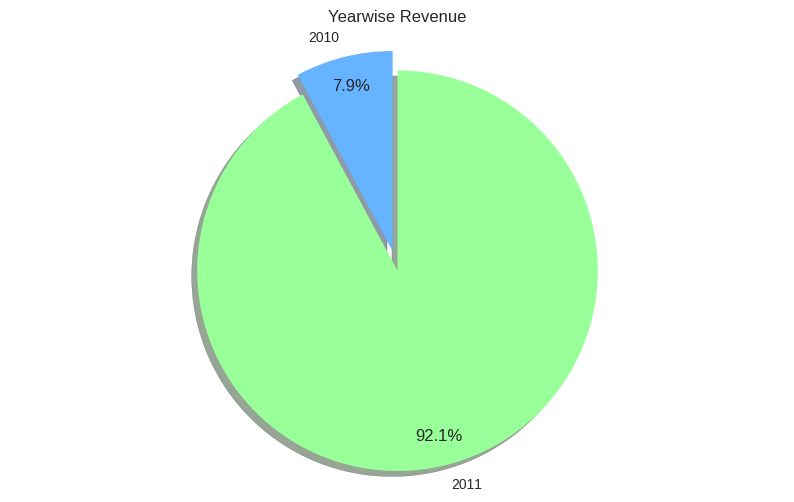

In [ ]:
# Chart - 4 visualization code
labels = yearwise_revenue.index
sizes = yearwise_revenue.values
colors = ['#66b3ff','#99ff99']
plt.pie(sizes, colors=colors, labels=labels , startangle=90, pctdistance=0.85,shadow=True,explode=(0.1,0),autopct='%1.1f%%')
plt.title('Yearwise Revenue')
plt.axis('equal')
plt.show()

  * 2010 year has low revenue Because The starting date of the dataset is: 2010-12-01 &

   The ending date of the dataset is: 2011-12-09 .

  * So the 2011 year has Most Revenue.

#### Chart - 5 : **Analysis Invoice Per Month**

In [ ]:
invoices_per_month = df.groupby('InvoiceMonth')['InvoiceNo'].nunique().sort_values(ascending=False)
invoices_per_month

,InvoiceNo
InvoiceMonth,
11,3387
12,2900
10,2533
9,2228
5,2024
6,1921
3,1818
7,1772
8,1655


In [ ]:
# Chart - 5 visualization code
fig = px.bar(x=invoices_per_month.index, y=invoices_per_month.values,
             labels={'x':'Month','y':'Number of Invoices'}, text=invoices_per_month.values,color=invoices_per_month.index)

fig.update_layout(
    title='Invoices per Month',
    xaxis=dict(tickmode='linear'),
    xaxis_tickangle=-90,
    width=1400,
    height=500
)
fig.show()

* November and December Month has Highest Ivoice Number.

#### Chart - 6 : **Analysis Stock Per Month**

In [ ]:
stock_per_month = df.groupby('InvoiceMonth')['StockCode'].nunique().sort_values(ascending=False)
stock_per_month

,StockCode
InvoiceMonth,
12,3457
11,2960
10,2895
9,2750
7,2695
6,2654
8,2610
1,2596
3,2522


In [ ]:
# Chart - 6 visualization code
fig = px.bar(x=stock_per_month.index, y=stock_per_month.values,
             labels={'x':'Month','y':'Number of StockCodes'}, text=stock_per_month.values,color=stock_per_month.index)

fig.update_layout(
    title='StockCodes per Month',
    xaxis=dict(tickmode='linear'),
    xaxis_tickangle=-90,
    width=1400,
    height=500
)
fig.show()

* December Month Has highest Number Of stocks.

#### Chart - 7 : **Analysis on 'Description' column:-**

In [ ]:
df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,InvoiceTime,InvoiceMonth,InvoiceYear,Revenue
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6.0,2010-12-01,2.55,17850,United Kingdom,08:26:00,12,2010,15.30
1,536365,71053,WHITE METAL LANTERN,6.0,2010-12-01,3.39,17850,United Kingdom,08:26:00,12,2010,20.34
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8.0,2010-12-01,2.75,17850,United Kingdom,08:26:00,12,2010,22.00
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6.0,2010-12-01,3.39,17850,United Kingdom,08:26:00,12,2010,20.34
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6.0,2010-12-01,3.39,17850,United Kingdom,08:26:00,12,2010,20.34


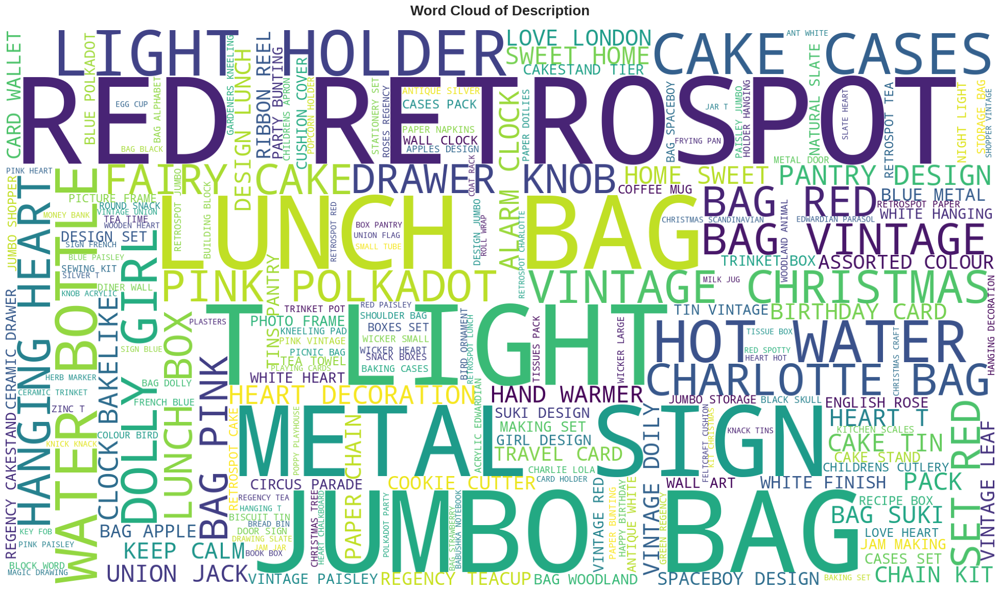

In [ ]:
# Chart - 7 visualization code
plt.subplots(figsize=(25,15))

df['Description'] = df['Description'].astype(str)
# parameters for wordcloud
wordcloud = WordCloud(
                          background_color='white',
                          width=1920,
                          height=1080
                          ).generate(' '.join(df['Description']))

plt.title('Word Cloud of Description',fontsize=20,pad=20,fontweight='bold')
plt.imshow(wordcloud)
plt.axis('off')
plt.savefig('wordcloud.png')
plt.show()

* **We will create a wordcloud to see which words appear the most in the Decription Column.**
* **Most repeated words in Description Column are RED , RETROSPOT , LIGHT , HOLDER , METAL , JUMBO , BAG , SIGN , WATER , CHARLOTTE , CHRISTMAS , VINTAGE and CASES.**

#### Chart - 8 : **Analysis on 'Country' column:-**

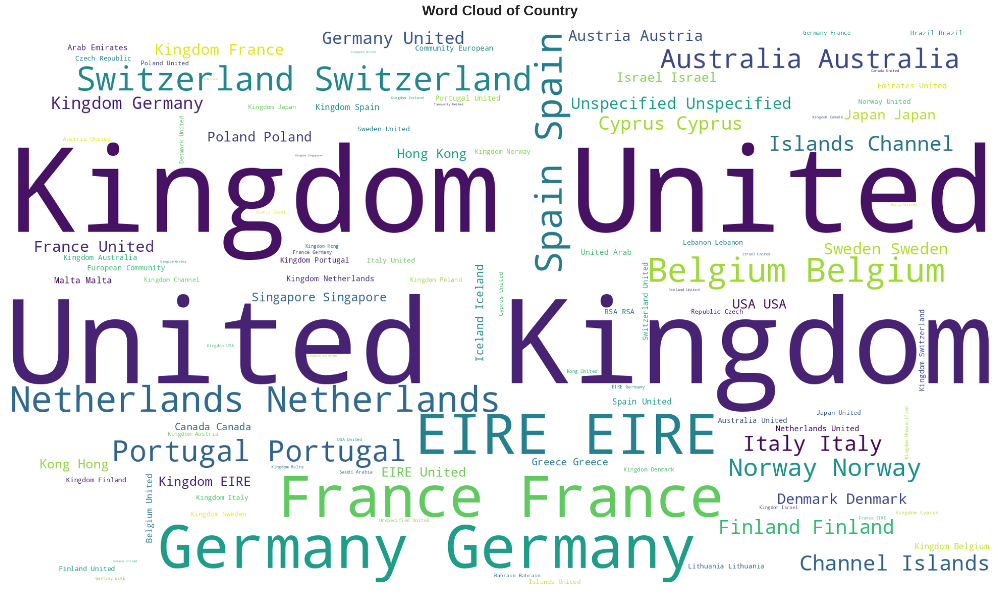

In [ ]:
# Chart - 8 visualization code
plt.subplots(figsize=(25,15))

df['Country'] = df['Country'].astype(str)
# parameters for wordcloud
wordcloud = WordCloud(
                          background_color='white',
                          width=1920,
                          height=1080
                          ).generate(" ".join(df['Country']))

plt.title('Word Cloud of Country',fontsize=20,pad=20,fontweight='bold')
plt.imshow(wordcloud)
plt.axis('off')
plt.savefig('wordcloud.png')
plt.show()

* **We will create a wordcloud to see which words appear the most in the Country Column.**

* **Most repeated words in Country Column are United kingdom , Netherlands , Switzerland , Germany , france , Belgium and Australia.**

## ***6. Feature Engineering & Data Pre-processing***

### **Feature Engineering**

we will add all text based or categorical columns

In [ ]:
df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,InvoiceTime,InvoiceMonth,InvoiceYear,Revenue
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6.0,2010-12-01,2.55,17850,United Kingdom,08:26:00,12,2010,15.30
1,536365,71053,WHITE METAL LANTERN,6.0,2010-12-01,3.39,17850,United Kingdom,08:26:00,12,2010,20.34
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8.0,2010-12-01,2.75,17850,United Kingdom,08:26:00,12,2010,22.00
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6.0,2010-12-01,3.39,17850,United Kingdom,08:26:00,12,2010,20.34
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6.0,2010-12-01,3.39,17850,United Kingdom,08:26:00,12,2010,20.34


In [ ]:
# We will add all categorical and text based columns
df['all_text'] = df['StockCode'].astype(str) + ' ' + df['Description'].astype(str) + ' ' + df['Country'].astype(str)

In [ ]:
# Checking
df['all_text'][0]

'85123A WHITE HANGING HEART T-LIGHT HOLDER United Kingdom'

###  **Text cleaning**

In [ ]:
#text cleaning function
import re
def clean_text(x):
    return re.sub(r"[^a-zA-Z ]","",str(x))

In [ ]:
# Applying above function on our combined column
df['all_text'] = df['all_text'].apply(clean_text)

In [ ]:
# we will convert all words in lowercase
df['all_text'] = df['all_text'].str.lower()

In [ ]:
#necessary import for nlp
import nltk
nltk.download('punkt_tab')
nltk.download('stopwords')
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem.snowball import SnowballStemmer
nltk.download('punkt')

[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

### **Stemming-**

In [ ]:
stemmer = SnowballStemmer('english')
stop_words = set(stopwords.words('english'))

In [ ]:
# defining a function to filter the words
def filter_words(string,filter_words):
  filtered=[]
  tokens = word_tokenize(string)
  for word in tokens:
    if word not in filter_words:
      filtered.append(stemmer.stem(word))
  return filtered

df['cleaned_text']= ''
for item, row in df.iterrows():
  df.at[item,'cleaned_text'] = filter_words(row['all_text'],stop_words)

df['cleaned_text']

,cleaned_text
0,"[white, hang, heart, tlight, holder, unit, kin..."
1,"[white, metal, lantern, unit, kingdom]"
2,"[b, cream, cupid, heart, coat, hanger, unit, k..."
3,"[g, knit, union, flag, hot, water, bottl, unit..."
4,"[e, red, woolli, hotti, white, heart, unit, ki..."
...,...
541904,"[pack, spaceboy, napkin, franc]"
541905,"[children, apron, dolli, girl, franc]"
541906,"[children, cutleri, dolli, girl, franc]"
541907,"[children, cutleri, circus, parad, franc]"


In [ ]:
#join words fun
def join_words(x):
  return " ".join(x)

In [ ]:
df['cleaned_text'] = df['cleaned_text'].apply(join_words)

In [ ]:
df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,InvoiceTime,InvoiceMonth,InvoiceYear,Revenue,all_text,cleaned_text
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6.0,2010-12-01,2.55,17850,United Kingdom,08:26:00,12,2010,15.30,a white hanging heart tlight holder united kin...,white hang heart tlight holder unit kingdom
1,536365,71053,WHITE METAL LANTERN,6.0,2010-12-01,3.39,17850,United Kingdom,08:26:00,12,2010,20.34,white metal lantern united kingdom,white metal lantern unit kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8.0,2010-12-01,2.75,17850,United Kingdom,08:26:00,12,2010,22.00,b cream cupid hearts coat hanger united kingdom,b cream cupid heart coat hanger unit kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6.0,2010-12-01,3.39,17850,United Kingdom,08:26:00,12,2010,20.34,g knitted union flag hot water bottle united k...,g knit union flag hot water bottl unit kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6.0,2010-12-01,3.39,17850,United Kingdom,08:26:00,12,2010,20.34,e red woolly hottie white heart united kingdom,e red woolli hotti white heart unit kingdom


In [ ]:
words = df.cleaned_text
words

,cleaned_text
0,white hang heart tlight holder unit kingdom
1,white metal lantern unit kingdom
2,b cream cupid heart coat hanger unit kingdom
3,g knit union flag hot water bottl unit kingdom
4,e red woolli hotti white heart unit kingdom
...,...
541904,pack spaceboy napkin franc
541905,children apron dolli girl franc
541906,children cutleri dolli girl franc
541907,children cutleri circus parad franc


### **using TF-IDF**
Term frequency-inverse document frequency is a text vectorizer that transforms the text into a usable vector.

In [ ]:
#using tfidf
from sklearn.feature_extraction.text import TfidfVectorizer
t_vectorizer = TfidfVectorizer(max_df = 0.9,min_df = 1,max_features = 1000)
X = t_vectorizer.fit_transform(words)

In [ ]:
X

<Compressed Sparse Row sparse matrix of dtype 'float64'
	with 2126616 stored elements and shape (535187, 1000)>

### **Applying PCA-Principal Component Analysis to reduce dimensions.**

In [ ]:
#PCA Code
import numpy as np
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
transformer = PCA()
transformer.fit(X.toarray())

PCA()

### **Cumulative Explained Variance**

Text(0, 0.5, 'cumulative explained variance')

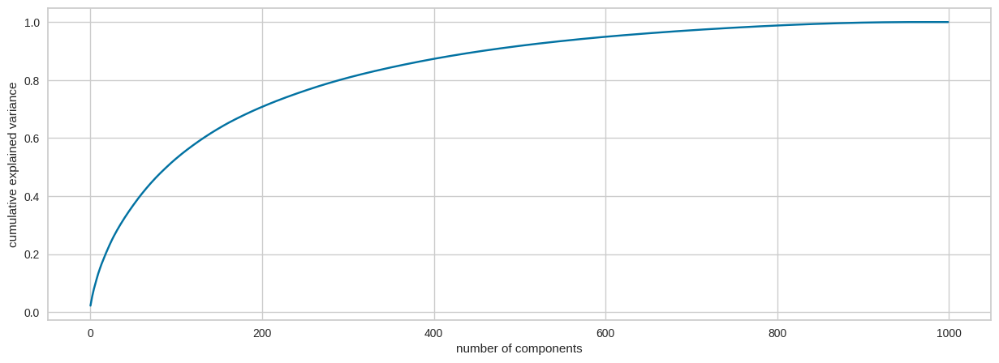

In [ ]:
 #explained var v/s comp
plt.figure(figsize=(15,5))
plt.plot(np.cumsum(transformer.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')

In [ ]:
#choosing right dim from plot, this might take a while, for ready ans use n_components = 300
from sklearn.decomposition import PCA
transformer = PCA(n_components=300)
transformer.fit(X.toarray())
X_transformed = transformer.transform(X.toarray())
X_transformed.shape

(535187, 300)

In [ ]:
# vectorizing the test and train
X_vectorized = t_vectorizer.transform(words)

In [ ]:
#applying pca
X= transformer.transform(X_vectorized.toarray())

In [ ]:
X

array([[-2.90973030e-01,  6.43218291e-01,  3.09360476e-01, ...,
        -4.52147928e-03, -8.42179783e-04, -1.02136464e-02],
       [-1.08047456e-01,  8.86418268e-02, -1.27691589e-02, ...,
         3.45774683e-03,  9.83083774e-03, -3.17452201e-02],
       [-9.52357610e-02,  9.99248706e-02,  3.12889306e-02, ...,
        -9.59342346e-02,  1.45639729e-02,  3.49671423e-02],
       ...,
       [ 2.02300438e-03, -4.95473454e-02, -7.35100640e-02, ...,
         1.84437845e-03,  5.20568147e-03, -9.23859590e-03],
       [-2.63702701e-02, -4.53599847e-02, -3.64317527e-02, ...,
         6.13481073e-03,  4.42999342e-03, -1.03205593e-02],
       [ 4.05037873e-02, -2.07898368e-01,  2.00323229e-01, ...,
         3.56695558e-04, -4.27490106e-04,  5.42426089e-03]])

## ***5. Cluster Model Implementation***

### **Silhouette Score Elbow for KMeans Clustering**

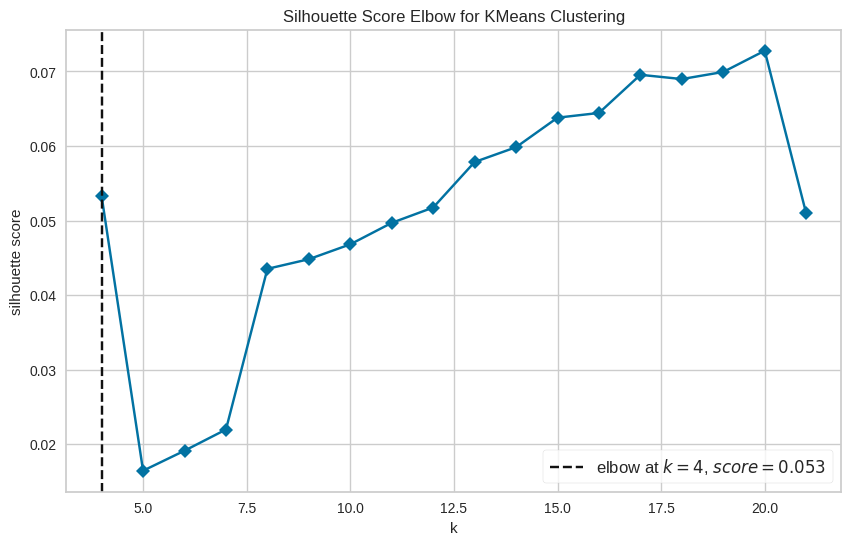

<Axes: title={'center': 'Silhouette Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='silhouette score'>

In [ ]:
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer
import numpy as np

# Assuming X is your data after PCA
# Select a smaller sample size (e.g., 10% of your data)
sample_size = int(0.1 * X.shape[0])
random_indices = np.random.choice(X.shape[0], size=sample_size, replace=False)
X_sample = X[random_indices]

# Instantiate the clustering model and visualizer
model = KMeans(random_state=42)
visualizer = KElbowVisualizer(
    model, k=(4, 22), metric='silhouette', timings=False
)

visualizer.fit(X_sample)        # Fit the data sample to the visualizer
visualizer.show()

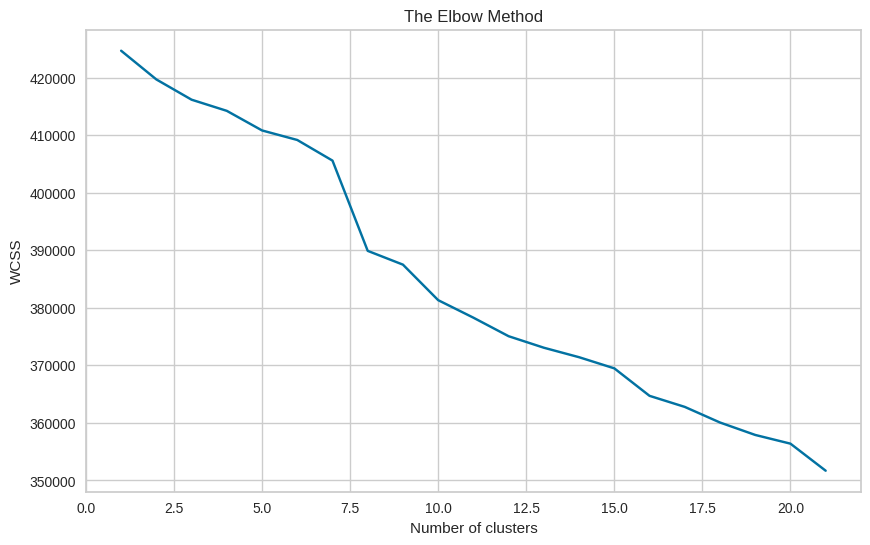

In [ ]:
# We will plot the graph to get the no. of clusters
wcss = []
for i in range(1, 22):
    kmeans = KMeans(n_clusters=i, init='k-means++', random_state=42,n_init='auto',max_iter=300)
    kmeans.fit(X)
    wcss.append(kmeans.inertia_)

plt.plot(range(1, 22), wcss)
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

* *italicized text* **we will take no. of clusters as 5**

### **Dendogram**

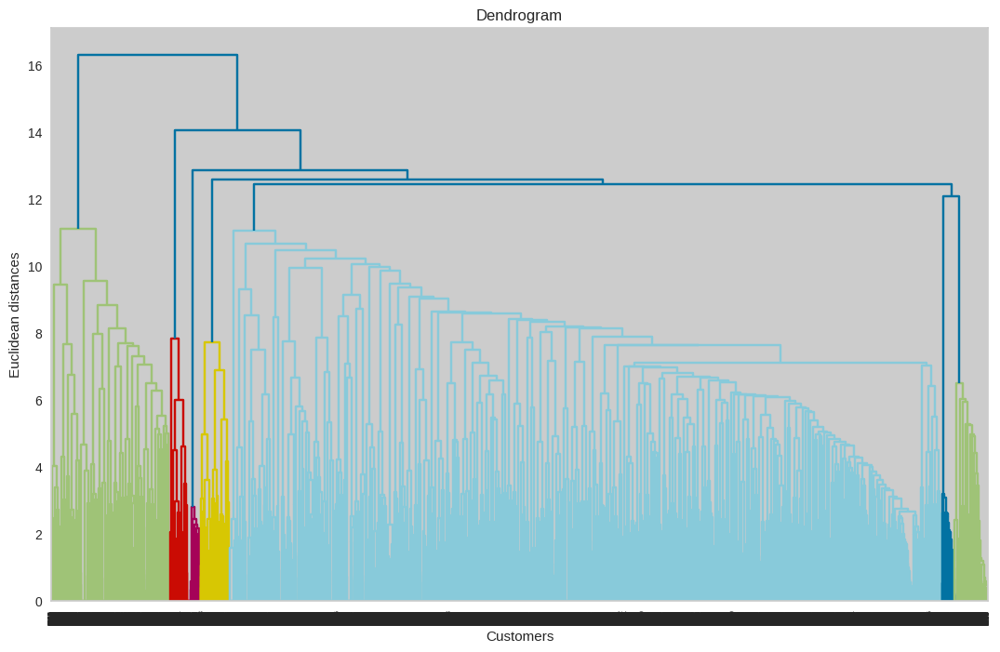

In [ ]:
# Assume X is your data after PCA
# Reduce the sample size further for dendrogram visualization
smaller_sample_size = 10000   # You can adjust this number
random_indices_smaller = np.random.choice(X.shape[0], size=smaller_sample_size, replace=False)
X_smaller_sample = X[random_indices_smaller]

plt.figure(figsize=(13,8))

# Use the smaller sample for linkage and dendrogram
dendrogram = sch.dendrogram(sch.linkage(X_smaller_sample, method  = "ward"))
plt.title('Dendrogram')
plt.xlabel('Customers')
plt.ylabel('Euclidean distances')
plt.show()

### **Agglomerative Clustering**

In [ ]:
# Let's  import AgglomerativeClustering
from sklearn.cluster import AgglomerativeClustering
hc = AgglomerativeClustering(n_clusters=5, metric='euclidean', linkage='ward')
y_hc = hc.fit_predict(X_smaller_sample)

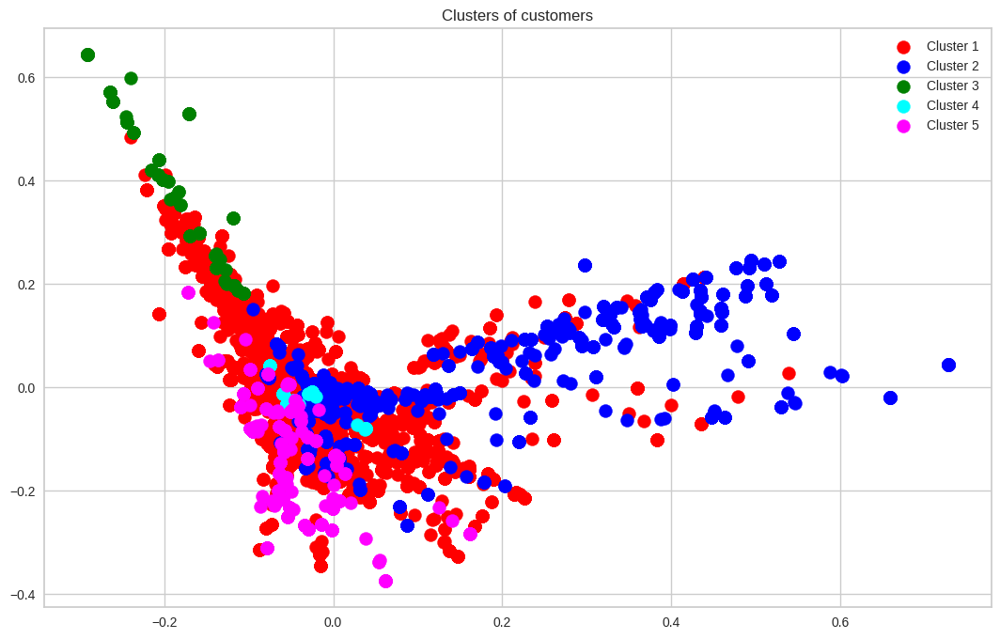

In [ ]:
# Visualizing the clusters (three dimensions only)
plt.figure(figsize=(13,8))
plt.scatter(X_smaller_sample[y_hc == 0, 0], X_smaller_sample[y_hc == 0, 1], s = 100, c = 'red', label = 'Cluster 1')
plt.scatter(X_smaller_sample[y_hc == 1, 0], X_smaller_sample[y_hc == 1, 1], s = 100, c = 'blue', label = 'Cluster 2')
plt.scatter(X_smaller_sample[y_hc == 2, 0], X_smaller_sample[y_hc == 2, 1], s = 100, c = 'green', label = 'Cluster 3')
plt.scatter(X_smaller_sample[y_hc == 3, 0], X_smaller_sample[y_hc == 3, 1], s = 100, c = 'cyan', label = 'Cluster 4')
plt.scatter(X_smaller_sample[y_hc == 4, 0], X_smaller_sample[y_hc == 4, 1], s = 100, c = 'magenta', label = 'Cluster 5')
plt.title('Clusters of customers')
plt.legend()
plt.show()

In [ ]:
# Check Silhouette Score for each cluster
from sklearn.cluster import AgglomerativeClustering
silhouette_score_ = []
range_n_clusters = [i for i in range(2,6)]
for n_clusters in range_n_clusters:
    clusterer = AgglomerativeClustering(n_clusters=n_clusters)
    preds = clusterer.fit_predict(X_smaller_sample)

    score = silhouette_score(X_smaller_sample, preds)
    silhouette_score_.append([int(n_clusters) , round(score , 3)])
    print("For n_clusters = {}, silhouette score is {}".format(n_clusters, score))

For n_clusters = 2, silhouette score is 0.04428335244996699
For n_clusters = 3, silhouette score is 0.043423578095809684
For n_clusters = 4, silhouette score is 0.04865611611767107
For n_clusters = 5, silhouette score is 0.04461784420102248


### **KMeans Clustering**

#### **Model fitting**

In [ ]:
# fitting the k means algorithm on lower features

kmeans = KMeans(n_clusters=5, init='k-means++',n_init=1,max_iter=300)
kmeans.fit(X)

KMeans(n_clusters=5, n_init=1)

**calculating silhouette score**

In [ ]:
# Predict the labels for the smaller sample
y_kmeans_smaller_sample = kmeans.predict(X_smaller_sample)

# Calculate the silhouette score using the smaller sample and its predicted labels
from sklearn.metrics import silhouette_score
print("Silhouette Coefficient:  %0.3f"%silhouette_score(X_smaller_sample, y_kmeans_smaller_sample))

Silhouette Coefficient:  0.027


**Predicting**

In [ ]:
#predict the labels of clusters.
label = kmeans.fit_predict(X)

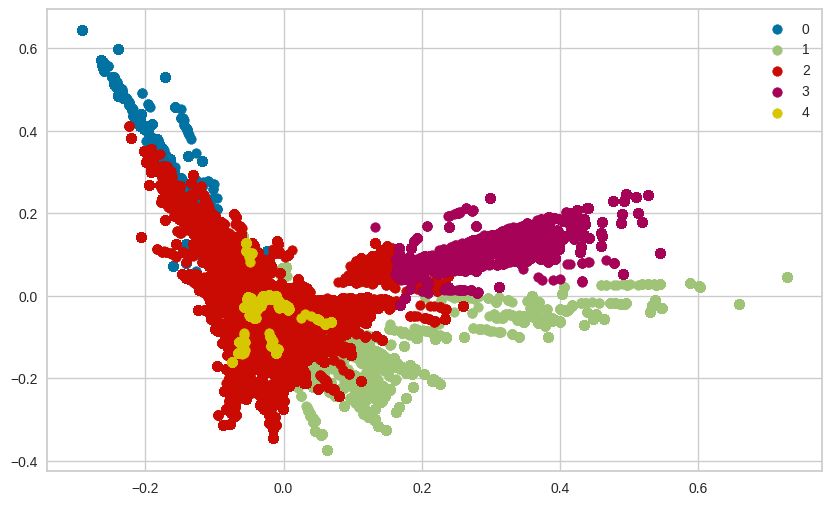

In [ ]:
#Getting unique labels
u_labels = np.unique(label)

#plotting the results:
for i in u_labels:
    plt.scatter(X[label == i , 0] , X[label == i , 1] , label = i)
plt.rcParams['figure.figsize'] = (25 , 7)
plt.legend()
plt.show()

**we now assign our clusters in our dataset by creating a new column "clusters"**

In [ ]:
# Assigning clusters to our data
df['clusters'] = kmeans.labels_

In [ ]:
# checking how it is working
df.head(2)

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,InvoiceTime,InvoiceMonth,InvoiceYear,Revenue,all_text,cleaned_text,clusters
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6.0,2010-12-01,2.55,17850,United Kingdom,08:26:00,12,2010,15.30,a white hanging heart tlight holder united kin...,white hang heart tlight holder unit kingdom,0
1,536365,71053,WHITE METAL LANTERN,6.0,2010-12-01,3.39,17850,United Kingdom,08:26:00,12,2010,20.34,white metal lantern united kingdom,white metal lantern unit kingdom,2


#### **Check all clusters**

In [ ]:
#word cloud imports
from os import path
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

**Defining a function to explore all the cluster using word cloud**


In [ ]:
# Define a function to explore all the cluster using word cloud
def word_count(category):
  print("Exploring Cluster", category)
  col_names = ['Description', 'Country']
  for col_name in col_names:
    # Check if the column exists in the DataFrame before proceeding
    if col_name in df.columns:
        df_word_cloud = df[['clusters',col_name]].dropna()
        df_word_cloud = df_word_cloud[df_word_cloud['clusters'] == category]
        text = " ".join(word for word in df_word_cloud[col_name])
        # Create stopword list:
        stopwords = set(STOPWORDS)
        # Generate a word cloud image
        wordcloud = WordCloud(stopwords=stopwords, background_color="black", width=1920, height=1080).generate(text)
        # Display the generated image:
        plt.rcParams["figure.figsize"] = (10,6)
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis("off")

        print(f"Looking for insights from {col_name} in Cluster {category}")
        plt.show()
    else:
        print(f"Column '{col_name}' not found in the DataFrame.")

##### **Analysis of cluster 0:-**

Exploring Cluster 0
Looking for insights from Description in Cluster 0


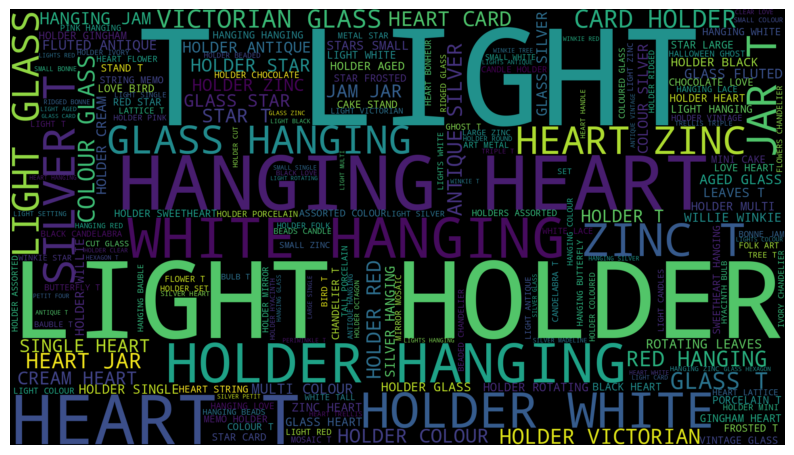

Looking for insights from Country in Cluster 0


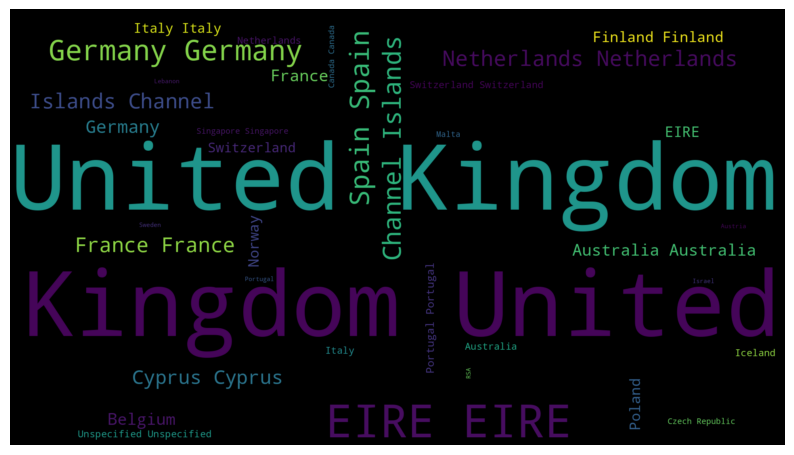

In [ ]:
#Analysis of cluster 0
word_count(0)

**Analysis of cluster 0**

* Countries:  United Kingdom , Netherlands , Finland , Germany , spain .
* Description: HOLDER, HEART, LIGHT, GLASS, WHITE, HANGING, RED, ZINK , CARD .

##### **Analysis of cluster 1:-**

Exploring Cluster 1
Looking for insights from Description in Cluster 1


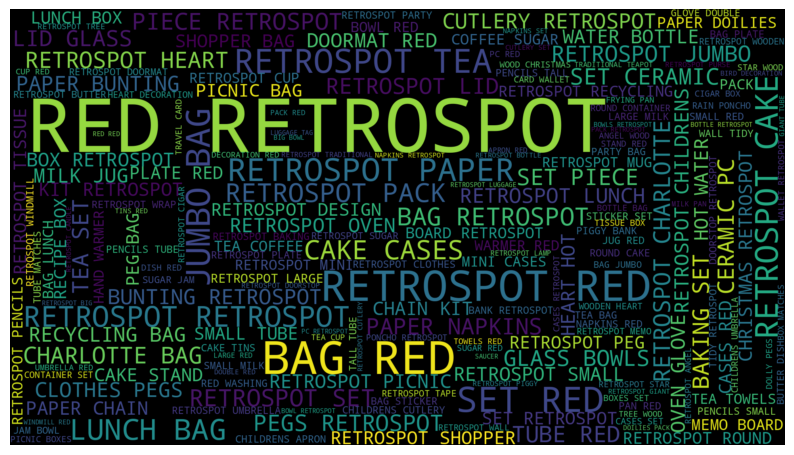

Looking for insights from Country in Cluster 1


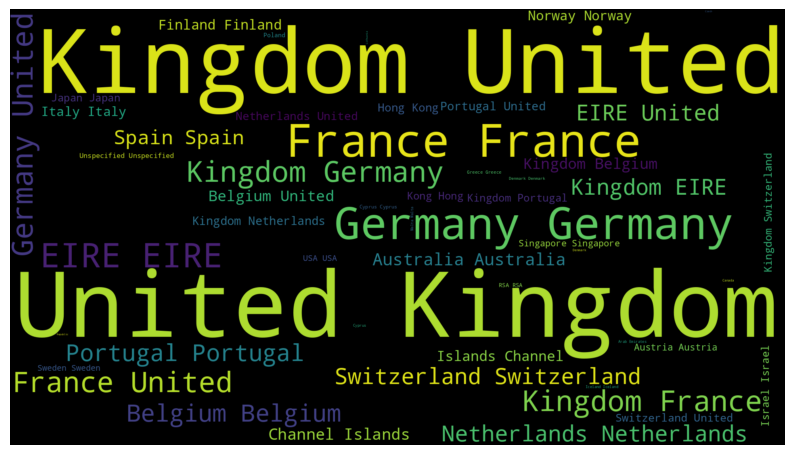

In [ ]:
#Analysis of cluster 1
word_count(1)

**Analysis of cluster 1**

* Countries: United Kingdom , France , Germany , Belgium ,Switzerland , Portugal , Italy , Norway , EIRE United.
* Description:  CAKE CASES, WATER BOTTLE , RETROSPOT, RED, LUNCH ,BAG , HEART, PICNIC , GLASS BOWLS , JUMBO , TEA , PEG , COFFEE .

##### **Analysis of cluster 2:-**

Exploring Cluster 2
Looking for insights from Description in Cluster 2


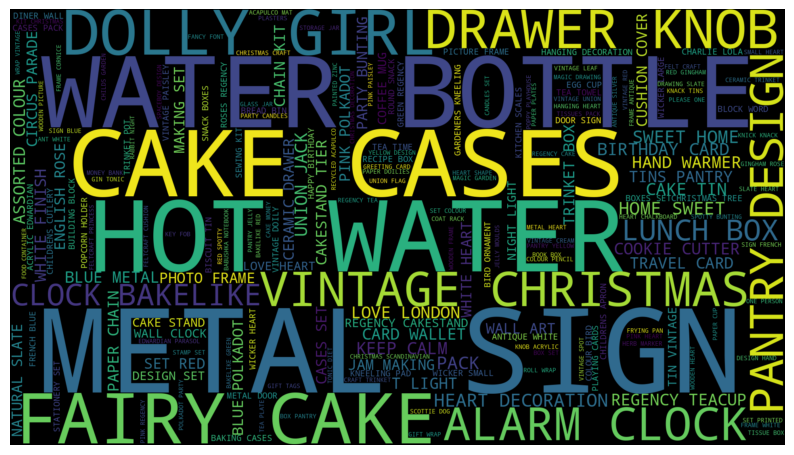

Looking for insights from Country in Cluster 2


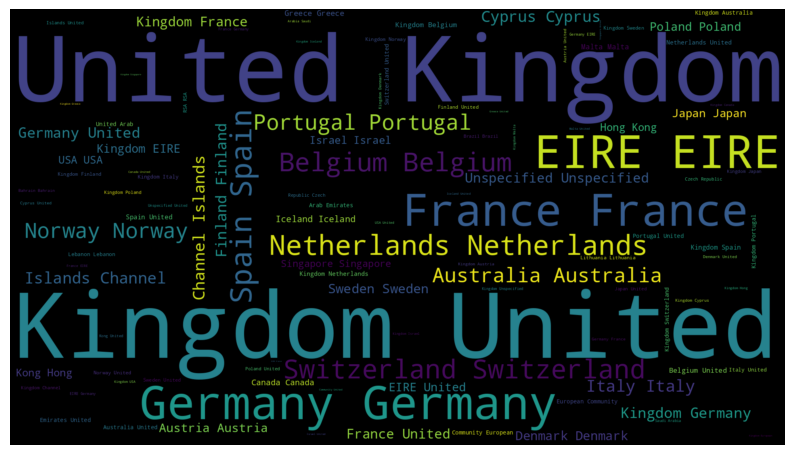

In [ ]:
#Analysis of cluster 2
word_count(2)

**Analysis of cluster 2**

* Countries: United Kingdom , Germany , Austria , Netherlands , Spain , Belgium , EIRE , Portugal , Italy , Norway , Japan.
* Description: DOLLY , GIRL , DRAWER , WATER , BOTTLE , CAKE , HOT , PANTRY , FAIRY, ALARM , CLOCK , SIGN, METAL, DESIGN, UNION , CHRISTMAS, VINTAGE, DECORATION .

##### **Analysis of cluster 3:-**

Exploring Cluster 3
Looking for insights from Description in Cluster 3


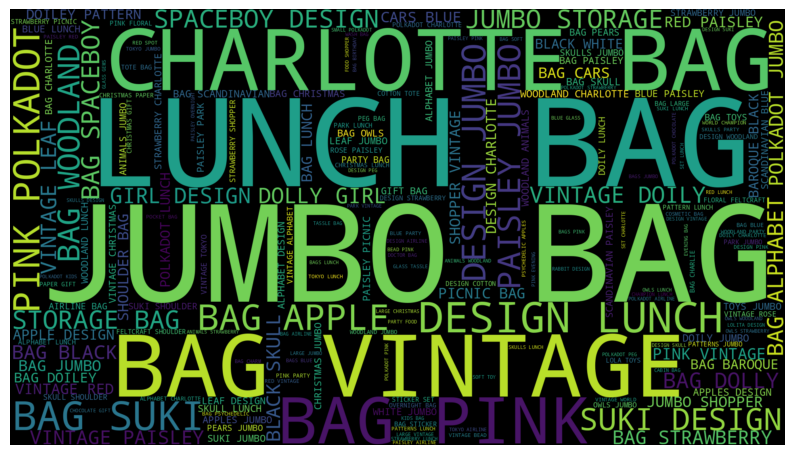

Looking for insights from Country in Cluster 3


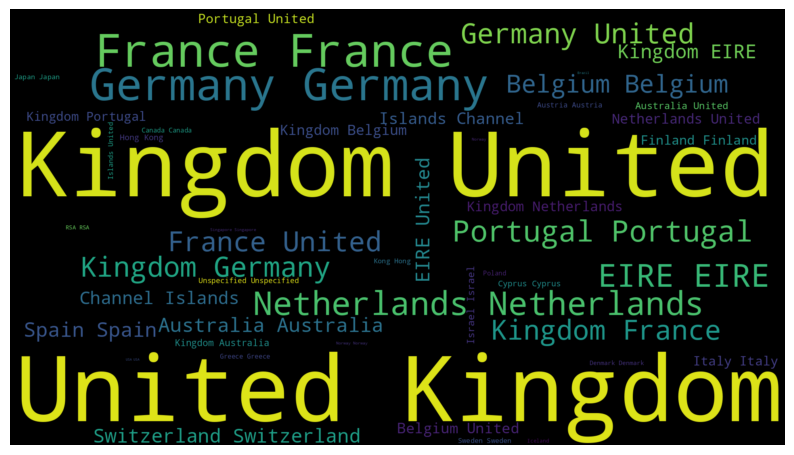

In [ ]:
#Analysis of cluster 3
word_count(3)

**Analysis of cluster 3**

* Countries: Germany, France, EIRE, Spain, Belgium, Switzerland , United Kingdom , Belgium , Netherlands , Portugal .
* Description: CHARLOTTE , LUNCH , JUMBO , BAG , PINK , VINTAGE , DESIGN ,WOODLAND , SPACEBOY , APPLE , STORAGE ,DOLLY , GIRL .

##### **Analysis of cluster 4:-**

Exploring Cluster 4
Looking for insights from Description in Cluster 4


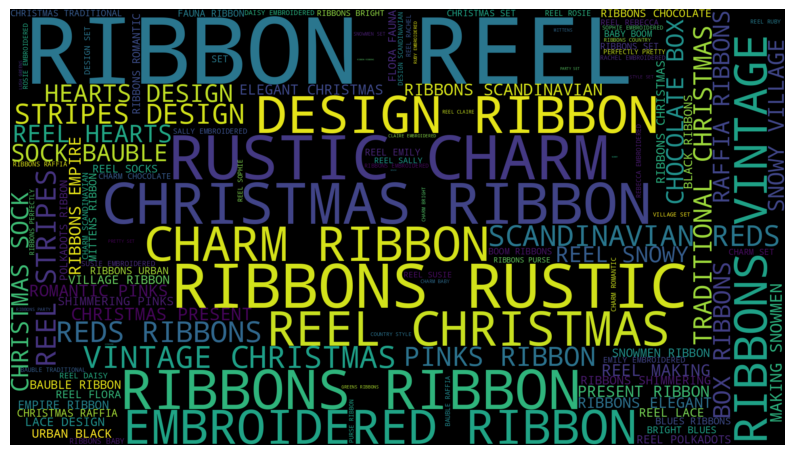

Looking for insights from Country in Cluster 4


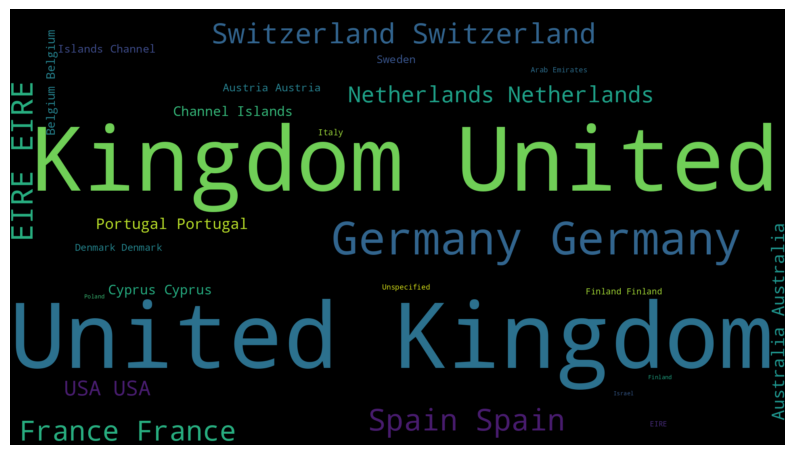

In [ ]:
#Analysis of cluster 3
word_count(4)

**Analysis of cluster 4**

* Countries: United Kingdom , France , Spain , Germany , USA , Switzerland , Netherland , Portugal , Island , Australia.
* Description: RIBBON , REEL ,HEARTS, CHRISTMAS , CHARM , DESIGN , TRADITIONAL , CHOCOLATE BOX , VINTAGE , STRIPES , EMPIRE , REDS , SNOWMAN .

### **Evaluation Metrics**

#### **Silhouette Score -**

In [ ]:
from sklearn.metrics import silhouette_samples
import matplotlib.cm as cm

For n_clusters = 2 The average silhouette_score is : -0.005881556538602702
For n_clusters = 3 The average silhouette_score is : 0.03181165980868491
For n_clusters = 4 The average silhouette_score is : 0.01925596407151507
For n_clusters = 5 The average silhouette_score is : 0.025376532678686874


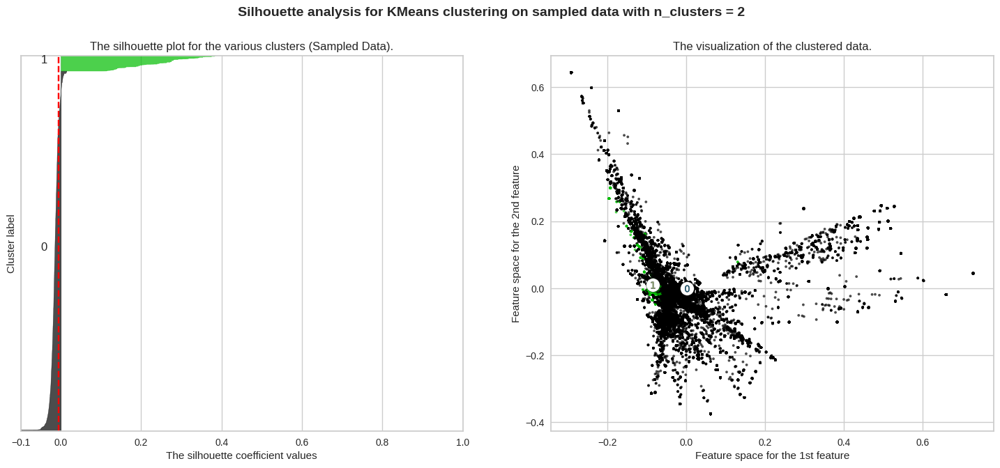

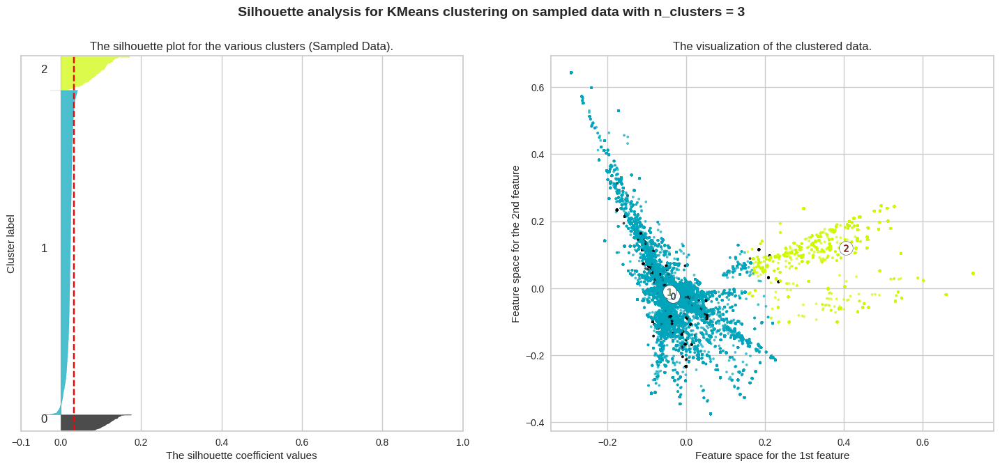

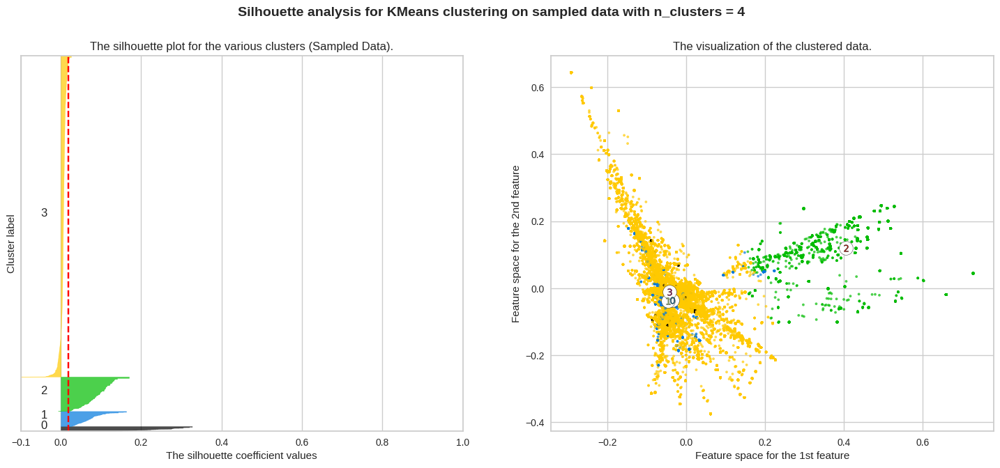

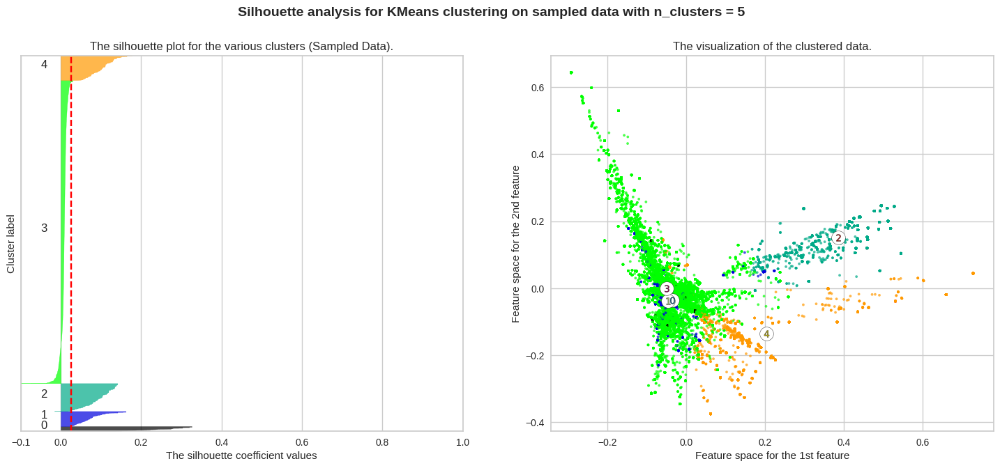

In [ ]:
from sklearn.metrics import silhouette_samples
import matplotlib.cm as cm
from sklearn.cluster import KMeans
import numpy as np

range_n_clusters = [i for i in range(2,6)]

# Select a smaller sample size (e.g., 10% of your data)
sample_size = int(0.1 * X.shape[0])
random_indices = np.random.choice(X.shape[0], size=sample_size, replace=False)
X_sample = X[random_indices]


for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X_sample) + (n_clusters + 1) * 10]) # Use sample length here

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10, n_init='auto') # Added n_init
    cluster_labels = clusterer.fit_predict(X_sample) # Fit and predict on the sample

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X_sample, cluster_labels) # Use sample here
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X_sample, cluster_labels) # Use sample here

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters (Sampled Data).")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) /n_clusters)
    ax2.scatter(X_sample[:, 0], X_sample[:, 1], marker='.', s=30, lw=0, alpha=0.7, # Use sample here
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")
    plt.suptitle(("Silhouette analysis for KMeans clustering on sampled data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

# **Conclusion:-**


## **1- Data Overview**

* [1] Data Overview

  * The dataset initially contains 541909 rows and 8 columns.
  * The columns include 'InvoiceNo', 'StockCode', 'Description', 'Quantity', 'InvoiceDate', 'UnitPrice', 'CustomerID', and 'Country'.
  * The data types include object, integer, datetime, and float.

* [2] Checking the null values

  * The 'Description' column has a significant number of missing values (1454 rows), which is about 0.27% of the total data.
  * The 'CustomerID' column also has missing values (135080 rows), which is about 24.93% of the total data.
  * The other columns ('InvoiceNo', 'StockCode', 'Quantity', 'InvoiceDate', 'UnitPrice', 'Country') do not have any missing values


* [3] Check Duplicate values in the dataset

 * There are 5268 duplicate rows in the initial dataset.

* After data wrangling steps in the notebook:

 * Rows with missing 'Description' values were dropped.
 * Missing 'CustomerID' values were filled with the mode.
 * Duplicate rows were dropped.
 * The 'Quantity' column was converted to its absolute value.
 * New columns 'InvoiceTime', 'InvoiceMonth', 'InvoiceYear', and 'Revenue' were created.

After these steps, the dataset has 395152 rows and 12 columns. There are no missing values and no duplicate rows in the processed dataset used for further analysis.


---

## **2- Exploratory Data Analysis**

**Chart - 1: Analysis 'Country' Column**

* The United Kingdom has a significantly higher number of unique customers compared to other countries in the dataset. This indicates it's the primary market for this online retail company.

**Chart - 2: Countrywise Revenue**

* The United Kingdom also generates the highest revenue. Germany and France are the next highest revenue-generating countries among the top 10. While some countries might have fewer customers than others in the top 10, their average revenue per customer might be higher.

**Chart - 3: Monthwise Revenue**

* Revenue is highest in November and December. There seems to be a significant increase in sales during the last couple of months of the year.

**Chart - 4: Yearwise Revenue**

* The year 2011 contributes a much larger percentage of the total revenue than 2010.

**Chart - 5: Invoices per Month**

* Similar to revenue, the number of invoices is highest in November and December. This corroborates the revenue trend and indicates increased purchase activity during these months.

**Chart - 6: StockCodes per Month**

* December has the highest number of unique stock codes sold. This could indicate a wider variety of products being purchased during the holiday season or potentially new products being introduced.

**Chart - 7: Word Cloud of Description**

* The most frequent words in product descriptions include "RED", "RETROSPOT", "LIGHT", "HOLDER", "METAL", "JUMBO", "BAG", "SIGN", "WATER", "CHARLOTTE", "CHRISTMAS", "VINTAGE", and "CASES". These terms suggest the types of products that are popular or frequently listed in the catalog.

**Chart - 8: Word Cloud of Country**

* "United Kingdom" is the largest word, reinforcing that it's the most frequent country in the dataset. Other visible countries include "Netherlands", "Switzerland", "Germany", "France", "Belgium", and "Australia".


---


## **3- Data pre-processing**

**1- Feature Engineering**
  * For train the model we use description column, country column, StockCode column.

**2- We performe Text cleaning as our next step**
  * convert all words in lowercase.

**3- We performe Stemming as our next step**
  * We remove all stopwords.
  * Also use stemming function.

**4- We performe TF-IDF vectorizer**
  * Term frequency-inverse document frequency is a text vectorizer that transforms the text into a usable vector.

**5- Applying PCA-Principal Component Analysis to reduce dimensions.**
  * We will use 300 components



---


## **4- Applying models**

**1- Find the value of clusters**
  * WE use Elbow method for finding k values.
  * Also use Silhouette Score for best score.
  * Also use Dendogram for finding the value of clusters.
  
**2- Use Agglomerative Clustering**

**3- Use KMeans Clustering**

Here are few clusters with there word cloud graph


**Analysis of cluster 0**

* Countries:  United Kingdom , Netherlands , Finland , Germany , spain .
* Description: HOLDER, HEART, LIGHT, GLASS, WHITE, HANGING, RED, ZINK , CARD .

**Analysis of cluster 1**

* Countries: United Kingdom , France , Germany , Belgium ,Switzerland , Portugal , Italy , Norway , EIRE United.
* Description:  CAKE CASES, WATER BOTTLE , RETROSPOT, RED, LUNCH ,BAG , HEART, PICNIC , GLASS BOWLS , JUMBO , TEA , PEG , COFFEE .

**Analysis of cluster 2**

* Countries: United Kingdom , Germany , Austria , Netherlands , Spain , Belgium , EIRE , Portugal , Italy , Norway , Japan.
* Description: DOLLY , GIRL , DRAWER , WATER , BOTTLE , CAKE , HOT , PANTRY , FAIRY, ALARM , CLOCK , SIGN, METAL, DESIGN, UNION , CHRISTMAS, VINTAGE, DECORATION .

**Analysis of cluster 3**

* Countries: Germany, France, EIRE, Spain, Belgium, Switzerland , United Kingdom , Belgium , Netherlands , Portugal .
* Description: CHARLOTTE , LUNCH , JUMBO , BAG , PINK , VINTAGE , DESIGN ,WOODLAND , SPACEBOY , APPLE , STORAGE ,DOLLY , GIRL .

**Analysis of cluster 4**

* Countries: United Kingdom , France , Spain , Germany , USA , Switzerland , Netherland , Portugal , Island , Australia.
* Description: RIBBON , REEL ,HEARTS, CHRISTMAS , CHARM , DESIGN , TRADITIONAL , CHOCOLATE BOX , VINTAGE , STRIPES , EMPIRE , REDS , SNOWMAN .

### ***Hurrah! You have successfully completed your Machine Learning Capstone Project !!!***